# Production LoRA Endpoint vs Gemini 3.1 Flash Image

This notebook compares the **same LoRA FastAPI endpoint used by the shopping app**
with the app's Gemini image-generation path.

It does not load Qwen or the LoRA inside Jupyter. The running FastAPI service owns
the GPU model.

### LoRA path used

```text
GET  http://127.0.0.1:8001/health
POST http://127.0.0.1:8001/edit
```

The POST is multipart form data with `image`, optional `reference_image`, `prompt`,
`seed`, `num_inference_steps`, `guidance_scale`, and `extra_input_json`. The
response is raw PNG.

### Gemini path used

The notebook mirrors the app backend: Vertex AI ADC, `gemini-3.1-flash-image`,
temperature 0.2, `TEXT` and `IMAGE` response modalities, and the same prompt
wrapper used by the app.

It measures repeated-request stability, latency, failures, and creates blinded
LoRA-versus-Gemini A/B sheets.

In [1]:
%pip install -U requests google-genai pillow pandas numpy matplotlib tqdm scikit-image ImageHash scipy

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.8/8.8 MB 75.9 MB/s  0:00:00
  Attempting uninstall: tqdm
    Found existing installation: tqdm 4.67.3
    Uninstalling tqdm-4.67.3:
      Successfully uninstalled tqdm-4.67.3
  Attempting uninstall: requests
    Found existing installation: requests 2.33.0
    Uninstalling requests-2.33.0:0m━━━━━━━━━━━━━━━━━━━━━━━━━━ 1/3 [requests]
      Successfully uninstalled requests-2.33.0━━━━━━━━━━━━━━━━ 1/3 [requests]
  Attempting uninstall: matplotlib0m━━━━━━━━━━━━━━━━━━━━━━━━━━ 1/3 [requests]
    Found existing installation: matplotlib 3.10.0━━━━━━━━━━━━ 1/3 [requests]
    Uninstalling matplotlib-3.10.0:╸━━━━━━━━━━━━━ 2/3 [matplotlib]
      Successfully uninstalled matplotlib-3.10.0━━━━━━━━━━━━━ 2/3 [matplotlib]
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3/3 [matplotlib]3 [matplotlib]
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency c

In [2]:
from pathlib import Path
import os

APP_ROOT = Path(
    "/home/akgupta_uchicago_edu/interior_design_recsys/"
    "shopping_agent_v2/"
    "renovation_adk_harness_streamlined_catalog_id_fixed/"
    "renovation_adk_harness_streamlined"
)

INPUT_IMAGE_PATH = APP_ROOT / "images" / "room_check.png"
REFERENCE_IMAGE_PATH = None

LORA_EDIT_URL = os.environ.get(
    "QWEN_LORA_API_URL", "http://127.0.0.1:8001/edit"
)
LORA_HEALTH_URL = os.environ.get(
    "QWEN_LORA_HEALTH_URL", "http://127.0.0.1:8001/health"
)
LORA_BEARER_TOKEN = os.environ.get("QWEN_LORA_HTTP_BEARER_TOKEN")

GOOGLE_CLOUD_PROJECT = os.environ.get(
    "GOOGLE_CLOUD_PROJECT", "adsp-s26-reccys"
)
GEMINI_LOCATION = os.environ.get("GEMINI_LOCATION", "global")
GEMINI_MODEL = os.environ.get(
    "INITIAL_GEMINI_IMAGE_MODEL", "gemini-3.1-flash-image"
)

N_REPEATS = 5
LORA_SEED = 42
NUM_INFERENCE_STEPS = 30
GUIDANCE_SCALE = 4.0
REQUEST_TIMEOUT_SECONDS = 900

SEND_REFERENCE_TO_LORA = False
SEND_REFERENCE_TO_GEMINI = True

EDIT_BRIEF = (
    "Create a photorealistic, professionally renovated living room with a warm, "
    "modern-minimalist design. Preserve the original room's architecture, camera "
    "viewpoint, perspective, geometry, wall positions, windows, doors, ceiling, "
    "flooring boundaries, and permanent structural elements. Replace or restyle "
    "only movable furniture, lighting, textiles, artwork, decor, colors, and "
    "material finishes. Use realistic proportions, coherent lighting, natural "
    "materials, and a refined but comfortable result. Do not add people, text, "
    "logos, watermarks, blur, warped geometry, duplicate furniture, new doors, "
    "new windows, or new structural features."
)

OUTPUT_ROOT = Path.cwd() / "lora_endpoint_vs_gemini_results"

print("Input:", INPUT_IMAGE_PATH)
print("LoRA:", LORA_EDIT_URL)
print("Gemini:", GEMINI_MODEL)
print("Project/location:", GOOGLE_CLOUD_PROJECT, GEMINI_LOCATION)

Input: /home/akgupta_uchicago_edu/interior_design_recsys/shopping_agent_v2/renovation_adk_harness_streamlined_catalog_id_fixed/renovation_adk_harness_streamlined/images/room_check.png
LoRA: http://127.0.0.1:8001/edit
Gemini: gemini-3.1-flash-image
Project/location: adsp-s26-reccys global


Run directory: /home/jupyter/lora_endpoint_vs_gemini_results/20260804T182506Z


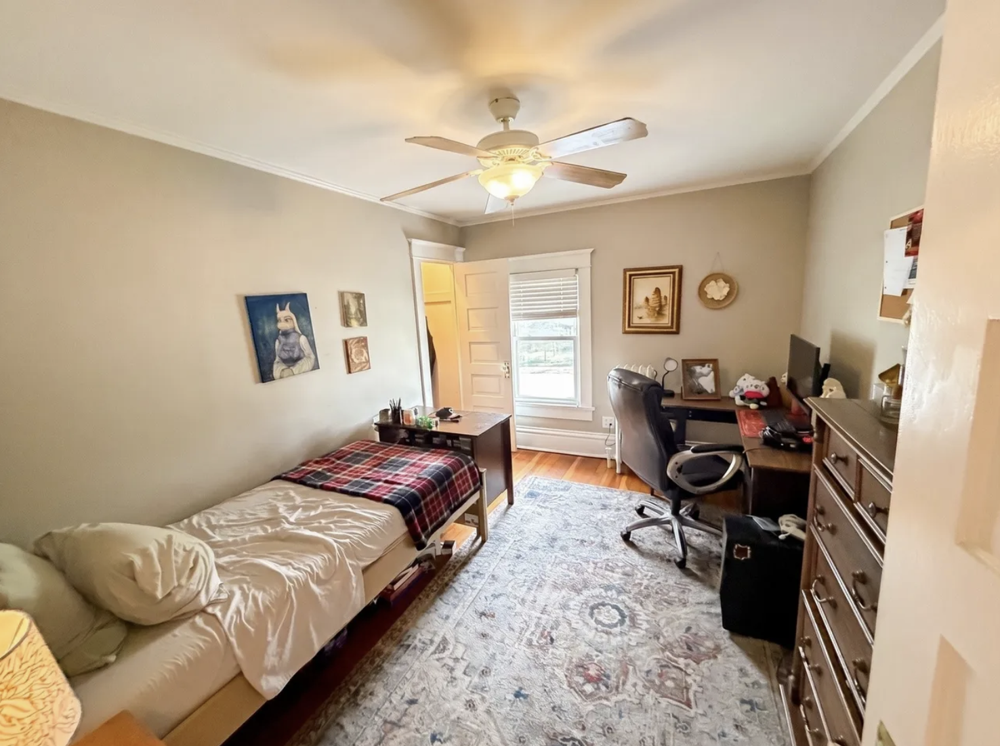

In [3]:
from __future__ import annotations

import base64
import hashlib
import io
import json
import math
import mimetypes
import random
import shutil
import time
import traceback
from datetime import datetime, timezone
from itertools import combinations
from pathlib import Path
from typing import Any

import numpy as np
import pandas as pd
import requests
from PIL import Image, ImageDraw, ImageFont, ImageOps
from IPython.display import display
from tqdm.auto import tqdm
import matplotlib.pyplot as plt

from google import genai
from google.genai import types

RUN_ID = datetime.now(timezone.utc).strftime("%Y%m%dT%H%M%SZ")
RUN_DIR = OUTPUT_ROOT / RUN_ID
IMAGE_DIR = RUN_DIR / "images"
METADATA_DIR = RUN_DIR / "metadata"
CONTACT_DIR = RUN_DIR / "contact_sheets"
BLIND_DIR = RUN_DIR / "blind_ab"

for directory in (RUN_DIR, IMAGE_DIR, METADATA_DIR, CONTACT_DIR, BLIND_DIR):
    directory.mkdir(parents=True, exist_ok=True)

if not INPUT_IMAGE_PATH.exists():
    raise FileNotFoundError(f"Input image not found: {INPUT_IMAGE_PATH}")
if REFERENCE_IMAGE_PATH is not None and not Path(REFERENCE_IMAGE_PATH).exists():
    raise FileNotFoundError(f"Reference image not found: {REFERENCE_IMAGE_PATH}")

print("Run directory:", RUN_DIR.resolve())
display(Image.open(INPUT_IMAGE_PATH).convert("RGB"))

In [10]:
def auth_headers() -> dict[str, str]:
    if not LORA_BEARER_TOKEN:
        return {}
    return {"Authorization": f"Bearer {LORA_BEARER_TOKEN}"}

health_response = requests.get(
    LORA_HEALTH_URL,
    headers=auth_headers(),
    timeout=60,
)
health_response.raise_for_status()
health = health_response.json()
display(health)

if health.get("status") != "ready":
    raise RuntimeError(f"LoRA endpoint is not ready: {health}")

(METADATA_DIR / "lora_health.json").write_text(
    json.dumps(health, indent=2), encoding="utf-8"
)

{'status': 'ready',
 'model_id': 'Qwen/Qwen-Image-Edit-2511',
 'lora_path': '/home/jupyter/recovered/qwen2511_lora_output/step-2880.safetensors',
 'diffsynth_dir': '/home/jupyter/DiffSynth-Studio',
 'cuda_available': True,
 'gpu': 'NVIDIA A100-SXM4-80GB',
 'use_reference_image': False,
 'last_seed': None}

317

In [6]:
gemini_client = genai.Client(
    vertexai=True,
    project=GOOGLE_CLOUD_PROJECT,
    location=GEMINI_LOCATION,
)
print("Gemini client initialized.")

Gemini client initialized.


In [7]:
def sha256_bytes(data: bytes) -> str:
    return hashlib.sha256(data).hexdigest()

def mime_for(path: Path) -> str:
    mime, _ = mimetypes.guess_type(path.name)
    return mime if mime and mime.startswith("image/") else "image/png"

def compose_gemini_prompt(prompt: str) -> str:
    return (
        "Image 1 is the user's original room. "
        "Image 2, when present, is the style reference selected by the user. "
        "Generate the first renovated-room result. Preserve the source room's architecture, "
        "camera viewpoint, geometry, windows, doors, wall positions, ceiling, floor boundaries, "
        "and perspective. Use the style reference for palette, furniture language, materials, "
        "decor density, and mood. Return a single photorealistic edited room image. "
        "Do not add text, people, watermarks, warped geometry, duplicated objects, or blur.\n\n"
        f"EDIT BRIEF:\n{prompt}"
    )

def extract_gemini_image(response: Any) -> tuple[bytes, str]:
    for candidate in getattr(response, "candidates", None) or []:
        content = getattr(candidate, "content", None)
        for part in getattr(content, "parts", None) or []:
            inline = getattr(part, "inline_data", None)
            if inline is None:
                continue
            data = getattr(inline, "data", None)
            if data:
                if isinstance(data, str):
                    data = base64.b64decode(data)
                return data, getattr(inline, "mime_type", None) or "image/png"
    raise RuntimeError(f"{GEMINI_MODEL} returned no inline image")

def image_size(data: bytes) -> tuple[int, int]:
    image = Image.open(io.BytesIO(data))
    image.load()
    return image.size

In [20]:
def call_lora(output_path: Path) -> dict[str, Any]:
    files = {
        "image": (
            INPUT_IMAGE_PATH.name,
            INPUT_IMAGE_PATH.read_bytes(),
            mime_for(INPUT_IMAGE_PATH),
        )
    }
    if SEND_REFERENCE_TO_LORA and REFERENCE_IMAGE_PATH is not None:
        ref = Path(REFERENCE_IMAGE_PATH)
        files["reference_image"] = (ref.name, ref.read_bytes(), mime_for(ref))

    form = {
        "prompt": EDIT_BRIEF,
        "seed": str(LORA_SEED),
        "num_inference_steps": str(NUM_INFERENCE_STEPS),
        "guidance_scale": str(GUIDANCE_SCALE),
        "extra_input_json": "{}",
    }

    start = time.perf_counter()
    response = requests.post(
        LORA_EDIT_URL,
        files=files,
        data=form,
        headers=auth_headers(),
        timeout=REQUEST_TIMEOUT_SECONDS,
    )
    elapsed = time.perf_counter() - start
    response.raise_for_status()

    content_type = response.headers.get("content-type", "").split(";")[0]
    if not content_type.startswith("image/"):
        raise RuntimeError(
            f"LoRA returned {content_type}: {response.text[:500]}"
        )

    data = response.content
    output_path.write_bytes(data)
    width, height = image_size(data)

    return {
        "elapsed_sec": elapsed,
        "mime_type": content_type,
        "sha256": sha256_bytes(data),
        "width": width,
        "height": height,
        "actual_seed": response.headers.get("X-Seed"),
        "model_header": response.headers.get("X-Model"),
    }

def call_gemini(output_path: Path) -> dict[str, Any]:
    parts = [
        types.Part.from_text(text=compose_gemini_prompt(EDIT_BRIEF)),
        types.Part.from_bytes(
            data=INPUT_IMAGE_PATH.read_bytes(),
            mime_type=mime_for(INPUT_IMAGE_PATH),
        ),
    ]
    if SEND_REFERENCE_TO_GEMINI and REFERENCE_IMAGE_PATH is not None:
        ref = Path(REFERENCE_IMAGE_PATH)
        parts.append(
            types.Part.from_bytes(data=ref.read_bytes(), mime_type=mime_for(ref))
        )

    start = time.perf_counter()
    # Exact app behavior: no seed is passed into Gemini GenerateContentConfig.
    response = gemini_client.models.generate_content(
        model=GEMINI_MODEL,
        contents=[types.Content(role="user", parts=parts)],
        config=types.GenerateContentConfig(
            temperature=0,
            response_modalities=["TEXT", "IMAGE"],
        ),
    )
    elapsed = time.perf_counter() - start

    data, mime_type = extract_gemini_image(response)
    output_path.write_bytes(data)
    width, height = image_size(data)

    return {
        "elapsed_sec": elapsed,
        "mime_type": mime_type,
        "sha256": sha256_bytes(data),
        "width": width,
        "height": height,
        "text_response": getattr(response, "text", None),
    }

In [21]:
records: list[dict[str, Any]] = []
lora_dir = IMAGE_DIR / "lora_endpoint"
gemini_dir = IMAGE_DIR / "gemini"
lora_dir.mkdir(exist_ok=True)
gemini_dir.mkdir(exist_ok=True)

for repeat in tqdm(range(N_REPEATS), desc="Endpoint vs Gemini"):
    order = ["lora", "gemini"] if repeat % 2 == 0 else ["gemini", "lora"]

    for system in order:
        row = {
            "repeat_index": repeat,
            "system": system,
            "status": "failed",
            "error": None,
            "seed_requested": LORA_SEED if system == "lora" else None,
        }

        try:
            if system == "lora":
                output_path = lora_dir / f"lora_repeat_{repeat:02d}.png"
                details = call_lora(output_path)
                row["model"] = (
                    details.get("model_header")
                    or "qwen-image-edit-2511-lora"
                )
            else:
                output_path = gemini_dir / f"gemini_repeat_{repeat:02d}.png"
                details = call_gemini(output_path)
                row["model"] = GEMINI_MODEL

            row.update(details)
            row["output_path"] = str(output_path)
            row["status"] = "success"

        except Exception as exc:
            row["error"] = f"{type(exc).__name__}: {exc}"
            traceback.print_exc(limit=2)

        records.append(row)

manifest_df = pd.DataFrame(records)
manifest_df.to_csv(
    METADATA_DIR / "generation_manifest.csv", index=False
)
display(manifest_df)

Endpoint vs Gemini:   0%|          | 0/5 [00:00<?, ?it/s]

,repeat_index,system,status,error,seed_requested,model,elapsed_sec,mime_type,sha256,width,height,actual_seed,model_header,output_path,text_response
0,0,lora,success,None,42.0,qwen-image-edit-2511-lora,65.196595,image/png,15a1f6f200a173013e327935dd30f90df8c2298fab6b17...,1184,880,42,qwen-image-edit-2511-lora,/home/jupyter/lora_endpoint_vs_gemini_results/...,NaN
1,0,gemini,success,None,NaN,gemini-3.1-flash-image,14.983418,image/png,ab263151c805c1bf4e9ada12c2db972eaf954eebd36e1f...,1200,896,NaN,NaN,/home/jupyter/lora_endpoint_vs_gemini_results/...,NaN
2,1,gemini,success,None,NaN,gemini-3.1-flash-image,12.782553,image/png,29ebbd0e6a5d2e11e7e774a62e8250d6054784635f3690...,1200,896,NaN,NaN,/home/jupyter/lora_endpoint_vs_gemini_results/...,NaN
3,1,lora,success,None,42.0,qwen-image-edit-2511-lora,65.367938,image/png,15a1f6f200a173013e327935dd30f90df8c2298fab6b17...,1184,880,42,qwen-image-edit-2511-lora,/home/jupyter/lora_endpoint_vs_gemini_results/...,NaN
4,2,lora,success,None,42.0,qwen-image-edit-2511-lora,65.505699,image/png,15a1f6f200a173013e327935dd30f90df8c2298fab6b17...,1184,880,42,qwen-image-edit-2511-lora,/home/jupyter/lora_endpoint_vs_gemini_results/...,NaN
5,2,gemini,success,None,NaN,gemini-3.1-flash-image,10.866451,image/png,445542c05231d8e4db7e30b7cc814a901d786ed02e5a03...,1200,896,NaN,NaN,/home/jupyter/lora_endpoint_vs_gemini_results/...,NaN
6,3,gemini,success,None,NaN,gemini-3.1-flash-image,14.965552,image/png,37cd4acc43afbe2593213c859f88f5b78a52cadab6ca68...,1200,896,NaN,NaN,/home/jupyter/lora_endpoint_vs_gemini_results/...,NaN
7,3,lora,success,None,42.0,qwen-image-edit-2511-lora,65.433947,image/png,15a1f6f200a173013e327935dd30f90df8c2298fab6b17...,1184,880,42,qwen-image-edit-2511-lora,/home/jupyter/lora_endpoint_vs_gemini_results/...,NaN
8,4,lora,success,None,42.0,qwen-image-edit-2511-lora,65.671778,image/png,15a1f6f200a173013e327935dd30f90df8c2298fab6b17...,1184,880,42,qwen-image-edit-2511-lora,/home/jupyter/lora_endpoint_vs_gemini_results/...,NaN
9,4,gemini,success,None,NaN,gemini-3.1-flash-image,11.624239,image/png,4b1c379dcdb8b0a583eb35a28af22e714bda169d62ed58...,1200,896,NaN,NaN,/home/jupyter/lora_endpoint_vs_gemini_results/...,NaN


,system,requests,successes,failures,mean_latency_sec,median_latency_sec,std_latency_sec,failure_rate
0,gemini,5,5,0,13.044443,12.782553,1.889411,0.0
1,lora,5,5,0,65.435192,65.433947,0.174927,0.0


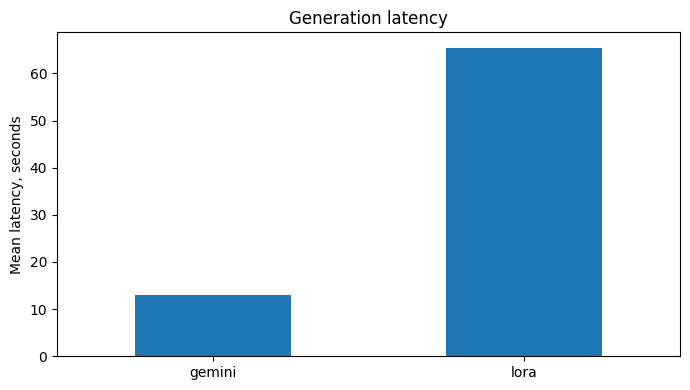

In [22]:
request_summary = (
    manifest_df.groupby("system")
    .agg(
        requests=("status", "size"),
        successes=("status", lambda x: int((x == "success").sum())),
        failures=("status", lambda x: int((x != "success").sum())),
        mean_latency_sec=("elapsed_sec", "mean"),
        median_latency_sec=("elapsed_sec", "median"),
        std_latency_sec=("elapsed_sec", "std"),
    )
    .reset_index()
)
request_summary["failure_rate"] = (
    request_summary["failures"] / request_summary["requests"]
)
request_summary.to_csv(
    METADATA_DIR / "request_summary.csv", index=False
)
display(request_summary)

ax = request_summary.plot(
    x="system",
    y="mean_latency_sec",
    kind="bar",
    legend=False,
    figsize=(7, 4),
)
ax.set_xlabel("")
ax.set_ylabel("Mean latency, seconds")
ax.set_title("Generation latency")
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

In [23]:
from skimage.metrics import structural_similarity
import imagehash

def metric_image(path: Path, size: int = 384) -> Image.Image:
    return ImageOps.fit(
        Image.open(path).convert("RGB"),
        (size, size),
        method=Image.Resampling.LANCZOS,
        centering=(0.5, 0.5),
    )

def calculate_ssim(path_a: Path, path_b: Path) -> float:
    a = np.asarray(metric_image(path_a), dtype=np.uint8)
    b = np.asarray(metric_image(path_b), dtype=np.uint8)
    return float(
        structural_similarity(a, b, channel_axis=2, data_range=255)
    )

def phash_similarity(path_a: Path, path_b: Path) -> float:
    a = imagehash.phash(metric_image(path_a))
    b = imagehash.phash(metric_image(path_b))
    return float(1.0 - (a - b) / len(a.hash.flatten()))

successful = manifest_df[manifest_df["status"] == "success"].copy()
pair_records = []

for system, group in successful.groupby("system"):
    rows = list(group.sort_values("repeat_index").to_dict("records"))
    for row_a, row_b in combinations(rows, 2):
        path_a = Path(row_a["output_path"])
        path_b = Path(row_b["output_path"])
        pair_records.append(
            {
                "system": system,
                "repeat_a": row_a["repeat_index"],
                "repeat_b": row_b["repeat_index"],
                "hash_equal": row_a["sha256"] == row_b["sha256"],
                "ssim": calculate_ssim(path_a, path_b),
                "phash_similarity": phash_similarity(path_a, path_b),
            }
        )

pairwise_df = pd.DataFrame(pair_records)
pairwise_df.to_csv(
    METADATA_DIR / "within_model_pairwise_metrics.csv", index=False
)

repeatability_summary = (
    pairwise_df.groupby("system")
    .agg(
        output_pairs=("hash_equal", "size"),
        exact_match_rate=("hash_equal", "mean"),
        mean_ssim=("ssim", "mean"),
        min_ssim=("ssim", "min"),
        std_ssim=("ssim", "std"),
        mean_phash_similarity=("phash_similarity", "mean"),
        min_phash_similarity=("phash_similarity", "min"),
    )
    .reset_index()
)
repeatability_summary.to_csv(
    METADATA_DIR / "repeatability_summary.csv", index=False
)

display(pairwise_df)
display(repeatability_summary)

,system,repeat_a,repeat_b,hash_equal,ssim,phash_similarity
0,gemini,0,1,False,0.500037,0.78125
1,gemini,0,2,False,0.552800,0.78125
2,gemini,0,3,False,0.583134,0.87500
3,gemini,0,4,False,0.556881,0.78125
4,gemini,1,2,False,0.484315,0.81250
5,gemini,1,3,False,0.524591,0.90625
6,gemini,1,4,False,0.478079,0.81250
7,gemini,2,3,False,0.542481,0.78125
8,gemini,2,4,False,0.569243,0.90625
9,gemini,3,4,False,0.543015,0.78125


,system,output_pairs,exact_match_rate,mean_ssim,min_ssim,std_ssim,mean_phash_similarity,min_phash_similarity
0,gemini,10,0.0,0.533458,0.478079,0.035779,0.821875,0.78125
1,lora,10,1.0,1.000000,1.000000,0.000000,1.000000,1.00000


/home/jupyter/lora_endpoint_vs_gemini_results/20260804T182506Z/contact_sheets/gemini_repeats.jpg


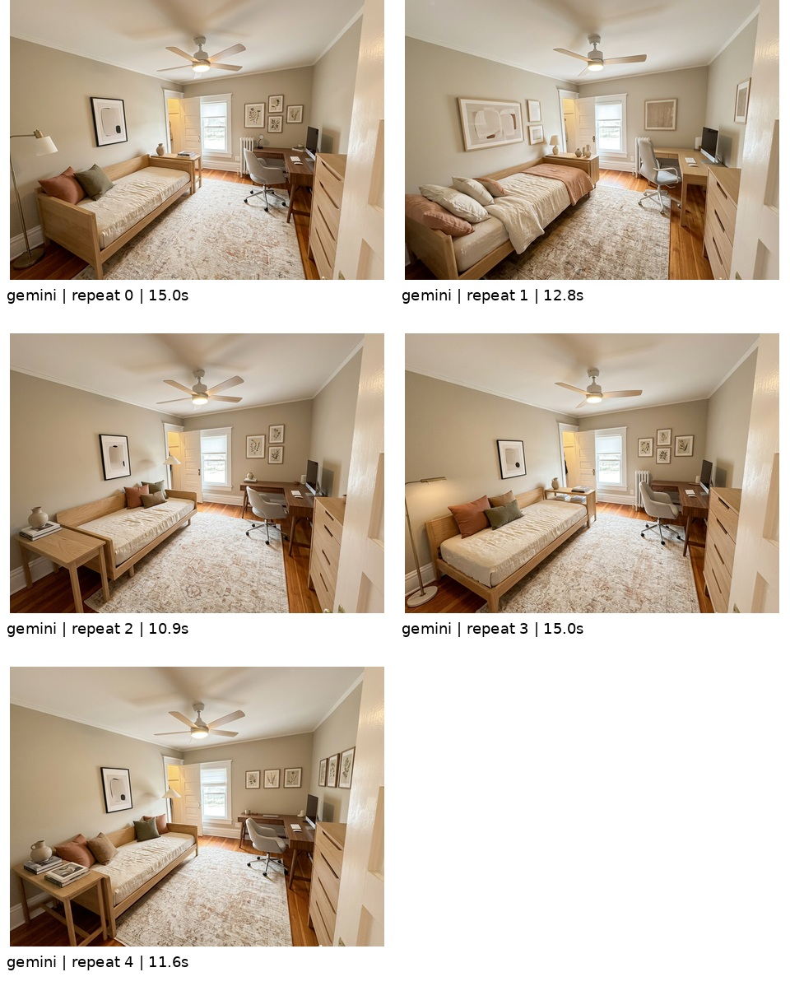

/home/jupyter/lora_endpoint_vs_gemini_results/20260804T182506Z/contact_sheets/lora_repeats.jpg


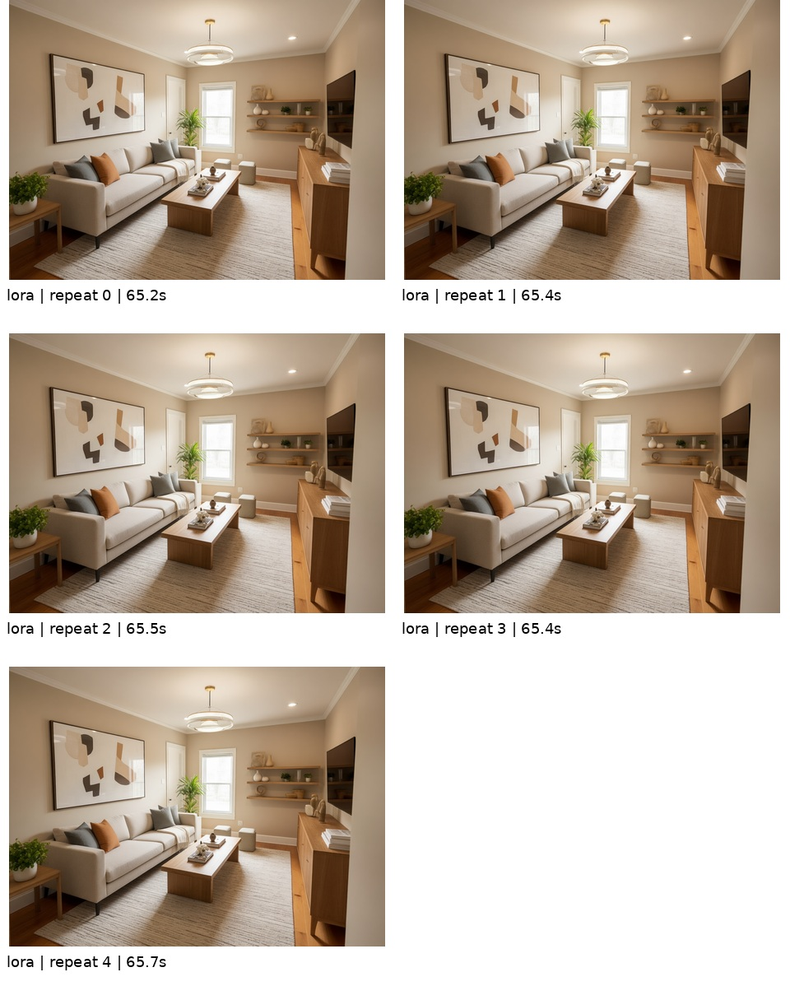

In [24]:
def get_font(size: int = 18):
    for path in [
        Path("/usr/share/fonts/truetype/dejavu/DejaVuSans.ttf"),
        Path("/usr/share/fonts/truetype/liberation2/LiberationSans-Regular.ttf"),
    ]:
        if path.exists():
            return ImageFont.truetype(str(path), size=size)
    return ImageFont.load_default()

def make_sheet(
    rows: pd.DataFrame,
    output_path: Path,
    columns: int = 2,
    thumb: tuple[int, int] = (480, 340),
):
    rows = rows.reset_index(drop=True)
    label_height = 65
    canvas = Image.new(
        "RGB",
        (
            columns * thumb[0],
            math.ceil(len(rows) / columns) * (thumb[1] + label_height),
        ),
        "white",
    )
    draw = ImageDraw.Draw(canvas)
    font = get_font()

    for index, row in rows.iterrows():
        image = Image.open(row["output_path"]).convert("RGB")
        image.thumbnail(thumb, Image.Resampling.LANCZOS)

        column = index % columns
        grid_row = index // columns
        x = column * thumb[0]
        y = grid_row * (thumb[1] + label_height)

        canvas.paste(
            image,
            (
                x + (thumb[0] - image.width) // 2,
                y + (thumb[1] - image.height) // 2,
            ),
        )
        draw.text(
            (x + 8, y + thumb[1] + 8),
            (
                f"{row['system']} | repeat {row['repeat_index']} | "
                f"{row['elapsed_sec']:.1f}s"
            ),
            fill="black",
            font=font,
        )

    canvas.save(output_path, "JPEG", quality=94)

for system, group in successful.groupby("system"):
    path = CONTACT_DIR / f"{system}_repeats.jpg"
    make_sheet(group.sort_values("repeat_index"), path)
    print(path)
    display(Image.open(path))

,pair_id,sheet_path,winner,architecture_preservation_1_to_5,prompt_adherence_1_to_5,visual_quality_1_to_5,notes
0,pair_00,/home/jupyter/lora_endpoint_vs_gemini_results/...,,,,,
1,pair_01,/home/jupyter/lora_endpoint_vs_gemini_results/...,,,,,
2,pair_02,/home/jupyter/lora_endpoint_vs_gemini_results/...,,,,,
3,pair_03,/home/jupyter/lora_endpoint_vs_gemini_results/...,,,,,
4,pair_04,/home/jupyter/lora_endpoint_vs_gemini_results/...,,,,,


Rate this file: /home/jupyter/lora_endpoint_vs_gemini_results/20260804T182506Z/metadata/blind_ratings.csv
Do not inspect until rating is complete: /home/jupyter/lora_endpoint_vs_gemini_results/20260804T182506Z/metadata/blind_key.csv


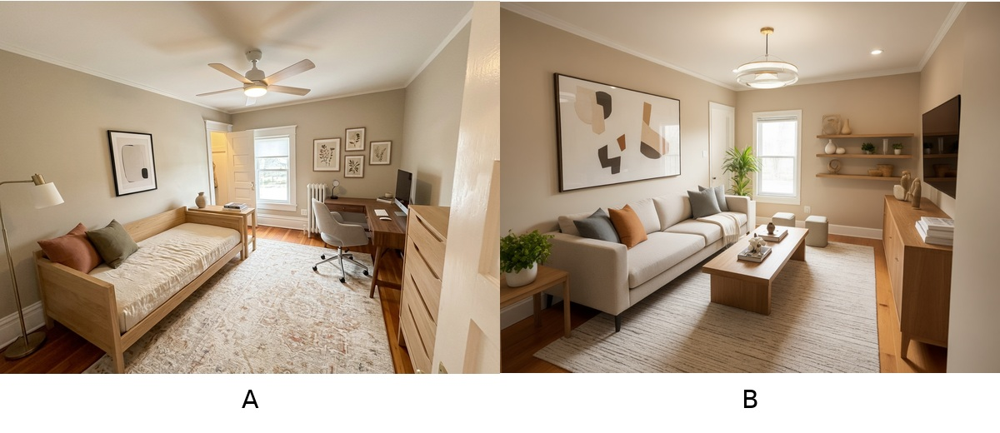

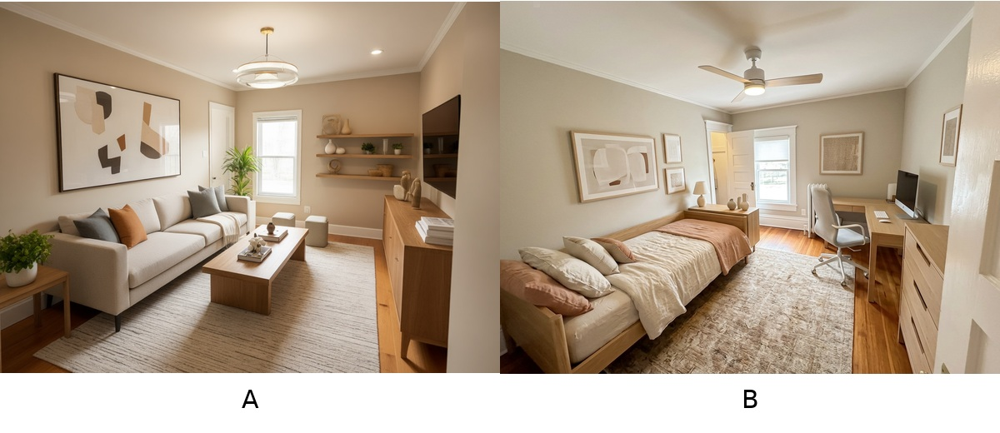

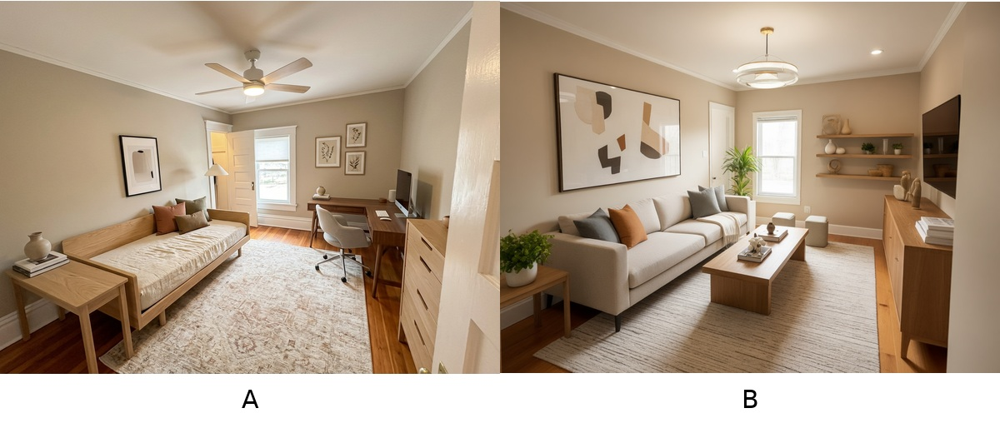

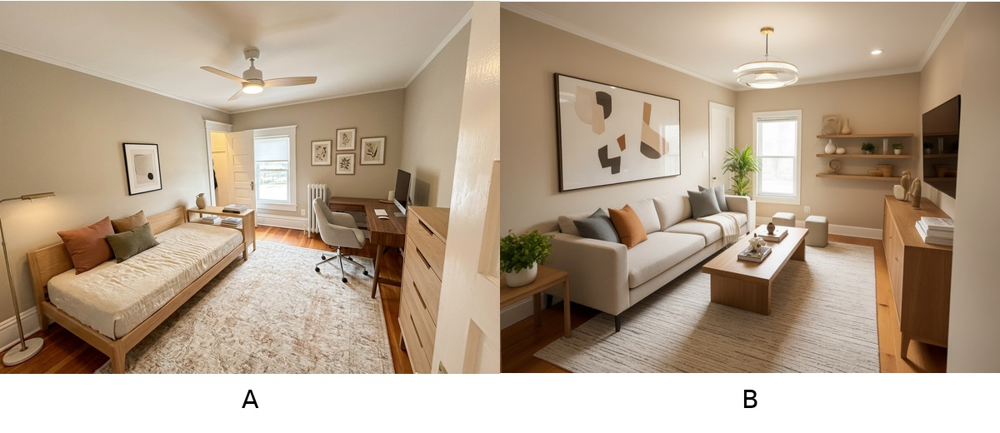

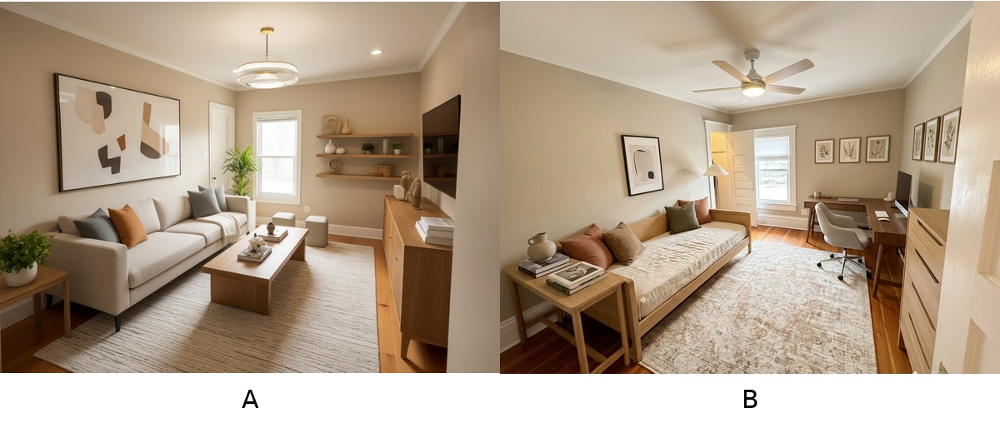

In [25]:
rng = random.Random(2026)
key_rows = []
rating_rows = []

paired_repeats = sorted(
    set(
        successful.loc[
            successful["system"] == "lora", "repeat_index"
        ]
    ).intersection(
        set(
            successful.loc[
                successful["system"] == "gemini", "repeat_index"
            ]
        )
    )
)

for repeat in paired_repeats:
    lora_row = successful[
        (successful["system"] == "lora")
        & (successful["repeat_index"] == repeat)
    ].iloc[0]
    gemini_row = successful[
        (successful["system"] == "gemini")
        & (successful["repeat_index"] == repeat)
    ].iloc[0]

    choices = [
        {"system": "lora", "path": Path(lora_row["output_path"])},
        {"system": "gemini", "path": Path(gemini_row["output_path"])},
    ]
    rng.shuffle(choices)

    pair_id = f"pair_{repeat:02d}"
    sheet_path = BLIND_DIR / f"{pair_id}.jpg"

    panel_width, panel_height, label_height = 600, 450, 70
    canvas = Image.new(
        "RGB",
        (panel_width * 2, panel_height + label_height),
        "white",
    )
    draw = ImageDraw.Draw(canvas)
    font = get_font(30)

    for index, choice in enumerate(choices):
        image = Image.open(choice["path"]).convert("RGB")
        image.thumbnail(
            (panel_width, panel_height),
            Image.Resampling.LANCZOS,
        )
        x = index * panel_width
        canvas.paste(
            image,
            (
                x + (panel_width - image.width) // 2,
                (panel_height - image.height) // 2,
            ),
        )
        draw.text(
            (x + panel_width // 2 - 10, panel_height + 12),
            "A" if index == 0 else "B",
            fill="black",
            font=font,
        )

    canvas.save(sheet_path, "JPEG", quality=94)

    key_rows.append(
        {
            "pair_id": pair_id,
            "sheet_path": str(sheet_path),
            "A_system": choices[0]["system"],
            "A_path": str(choices[0]["path"]),
            "B_system": choices[1]["system"],
            "B_path": str(choices[1]["path"]),
        }
    )
    rating_rows.append(
        {
            "pair_id": pair_id,
            "sheet_path": str(sheet_path),
            "winner": "",
            "architecture_preservation_1_to_5": "",
            "prompt_adherence_1_to_5": "",
            "visual_quality_1_to_5": "",
            "notes": "",
        }
    )

key_df = pd.DataFrame(key_rows)
ratings_df = pd.DataFrame(rating_rows)

key_path = METADATA_DIR / "blind_key.csv"
ratings_path = METADATA_DIR / "blind_ratings.csv"
key_df.to_csv(key_path, index=False)
ratings_df.to_csv(ratings_path, index=False)

display(ratings_df)
print("Rate this file:", ratings_path)
print("Do not inspect until rating is complete:", key_path)

for path in ratings_df["sheet_path"]:
    display(Image.open(path))